# Manish Mohan

### Attrition Prediction

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import statsmodels.api as sma
import scipy
import scipy.stats as stats
from scipy.stats import chisquare
from scipy.stats import chi2
from scipy.stats import chi2_contingency
from scipy.stats import zscore

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import PowerTransformer
from sklearn.feature_selection import RFE
from sklearn import tree

from IPython.display import Image
from sklearn.ensemble import RandomForestClassifier
import imblearn
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,roc_curve,roc_auc_score,\
ConfusionMatrixDisplay,cohen_kappa_score

In [2]:
import category_encoders as ce

In [3]:
df=pd.read_csv(r'C:\Users\manis\Attrition-Forecast-Analysis-and-Prediction_Fork\Acme_Attrition Data\WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [4]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [6]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [7]:
for i in df.columns:
    unique_values = df[i].unique()
    print(f"Unique values in {i}: {unique_values}")

Unique values in Age: [41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60]
Unique values in Attrition: ['Yes' 'No']
Unique values in BusinessTravel: ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Unique values in DailyRate: [1102  279 1373 1392  591 1005 1324 1358  216 1299  809  153  670 1346
  103 1389  334 1123 1219  371  673 1218  419  391  699 1282 1125  691
  477  705  924 1459  125  895  813 1273  869  890  852 1141  464 1240
 1357  994  721 1360 1065  408 1211 1229  626 1434 1488 1097 1443  515
  853 1142  655 1115  427  653  989 1435 1223  836 1195 1339  664  318
 1225 1328 1082  548  132  746  776  193  397  945 1214  111  573 1153
 1400  541  432  288  669  530  632 1334  638 1093 1217 1353  120  682
  489  807  827  871  665 1040 1420  240 1280  534 1456  658  142 1127
 1031 1189 1354 1467  922  394 1312  750  441  684  249  841  147  528
  594  470  957  542  802 1355 1150 1329  959 1033 131

In [8]:
for i in df.columns:
    unique_values = df[i].nunique()
    print(f"N Unique values in {i}: {unique_values}")

N Unique values in Age: 43
N Unique values in Attrition: 2
N Unique values in BusinessTravel: 3
N Unique values in DailyRate: 886
N Unique values in Department: 3
N Unique values in DistanceFromHome: 29
N Unique values in Education: 5
N Unique values in EducationField: 6
N Unique values in EmployeeCount: 1
N Unique values in EmployeeNumber: 1470
N Unique values in EnvironmentSatisfaction: 4
N Unique values in Gender: 2
N Unique values in HourlyRate: 71
N Unique values in JobInvolvement: 4
N Unique values in JobLevel: 5
N Unique values in JobRole: 9
N Unique values in JobSatisfaction: 4
N Unique values in MaritalStatus: 3
N Unique values in MonthlyIncome: 1349
N Unique values in MonthlyRate: 1427
N Unique values in NumCompaniesWorked: 10
N Unique values in Over18: 1
N Unique values in OverTime: 2
N Unique values in PercentSalaryHike: 15
N Unique values in PerformanceRating: 2
N Unique values in RelationshipSatisfaction: 4
N Unique values in StandardHours: 1
N Unique values in StockOptio

In [9]:
df.describe(include=object).T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
Over18,1470,1,Y,1470
OverTime,1470,2,No,1054


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [11]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [12]:
df.duplicated().sum()

0

In [13]:
df.Attrition.unique()

array(['Yes', 'No'], dtype=object)

### Preprocessing

In [14]:
df2=df.drop(['EmployeeCount','Over18','StandardHours'],axis=1)

# removes as the features have only one catagory

In [15]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 32 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeNumber            1470 non-null   int64 
 9   EnvironmentSatisfaction   1470 non-null   int64 
 10  Gender                    1470 non-null   object
 11  HourlyRate                1470 non-null   int64 
 12  JobInvolvement            1470 non-null   int64 
 13  JobLevel                  1470 non-null   int64 
 14  JobRole                 

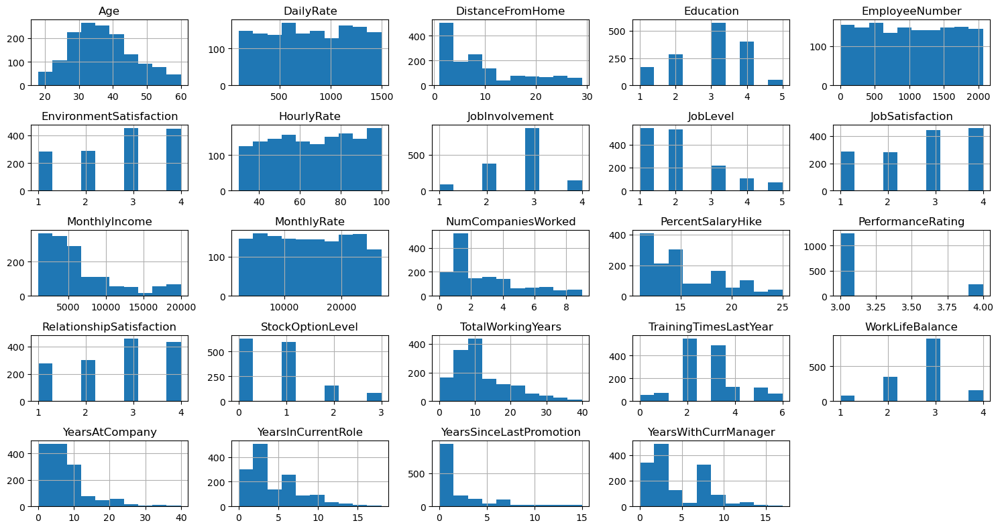

In [16]:
df2.hist(figsize=(15,8))
plt.tight_layout()
plt.show()

##### To be converted to object

- education
- environmentsatisfaction
- jobinvolvement
- joblevel
- jobsatisfaction
- performancerating
- relationshipsatisfaction
- stockoptionlevel
- worklifebalance


- NumCompaniesWorked
- TrainingTimesLastYear

##### others

- YearsSinceLastPromotion
- YearsInCurrentRole
- YearsAtCompany
- TotalWorkingYears
- PercentSalaryHike

In [17]:
to_obj=['Education','EnvironmentSatisfaction','JobInvolvement','JobLevel','JobSatisfaction','PerformanceRating','RelationshipSatisfaction','StockOptionLevel','WorkLifeBalance','NumCompaniesWorked','TrainingTimesLastYear']

In [18]:
df2[to_obj]=df2[to_obj].astype(object)

In [19]:
df2.describe(include=object).T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
Education,1470,5,3,572
EducationField,1470,6,Life Sciences,606
EnvironmentSatisfaction,1470,4,3,453
Gender,1470,2,Male,882
JobInvolvement,1470,4,3,868
JobLevel,1470,5,1,543
JobRole,1470,9,Sales Executive,326


In [20]:
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
MonthlyIncome,1470.0,6502.931293,4707.956783,1009.0,2911.00,4919.0,8379.00,19999.0
MonthlyRate,1470.0,14313.103401,7117.786044,2094.0,8047.00,14235.5,20461.50,26999.0
PercentSalaryHike,1470.0,15.209524,3.659938,11.0,12.00,14.0,18.00,25.0
TotalWorkingYears,1470.0,11.279592,7.780782,0.0,6.00,10.0,15.00,40.0
YearsAtCompany,1470.0,7.008163,6.126525,0.0,3.00,5.0,9.00,40.0


Boxplot for the column  Age


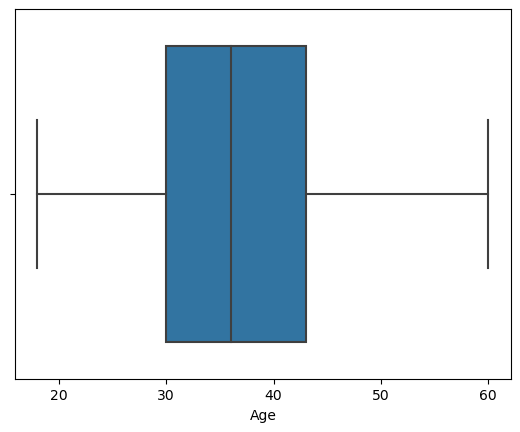

Boxplot for the column  DailyRate


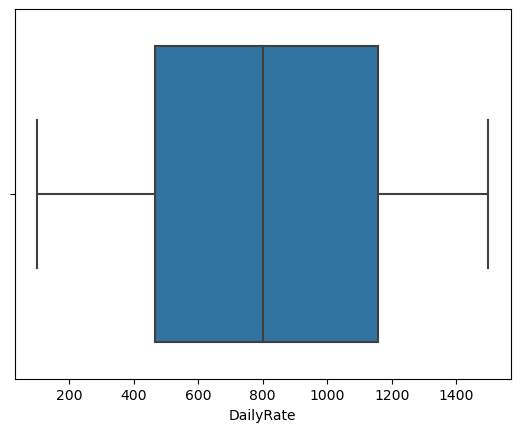

Boxplot for the column  DistanceFromHome


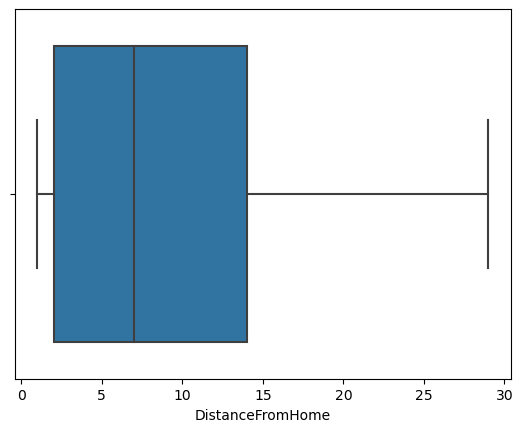

Boxplot for the column  EmployeeNumber


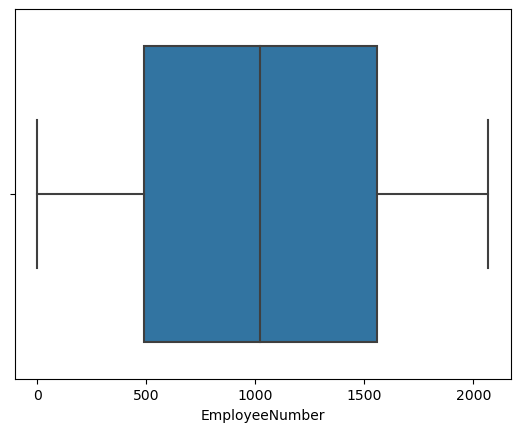

Boxplot for the column  HourlyRate


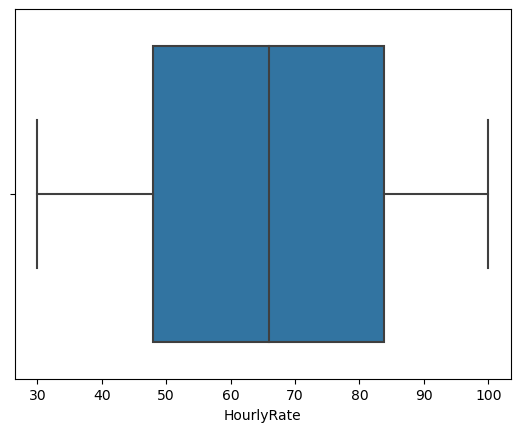

Boxplot for the column  MonthlyIncome


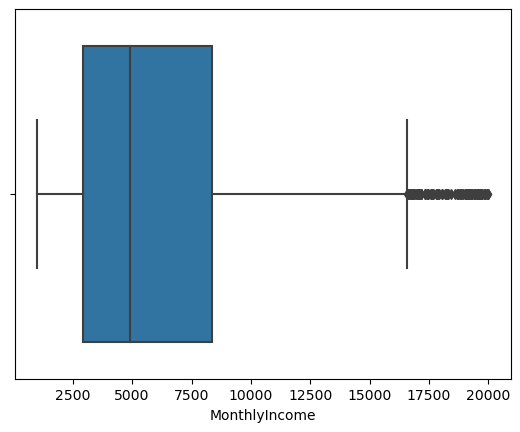

Boxplot for the column  MonthlyRate


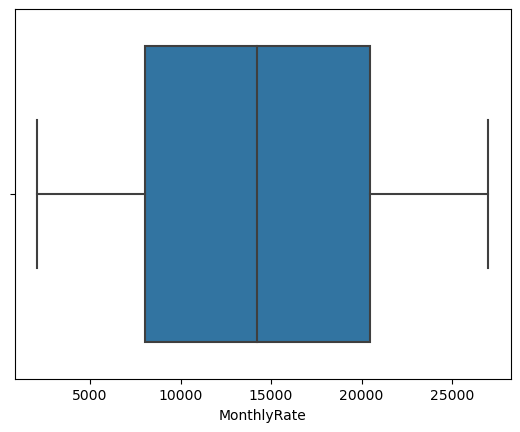

Boxplot for the column  PercentSalaryHike


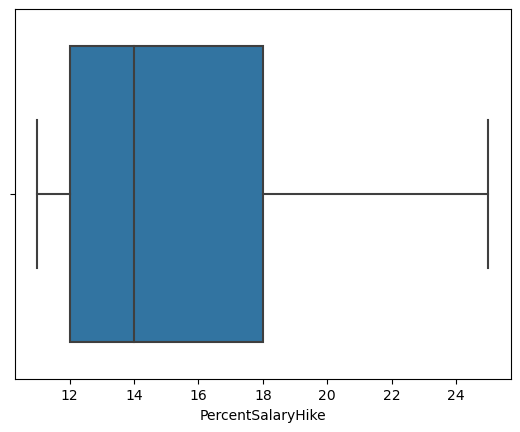

Boxplot for the column  TotalWorkingYears


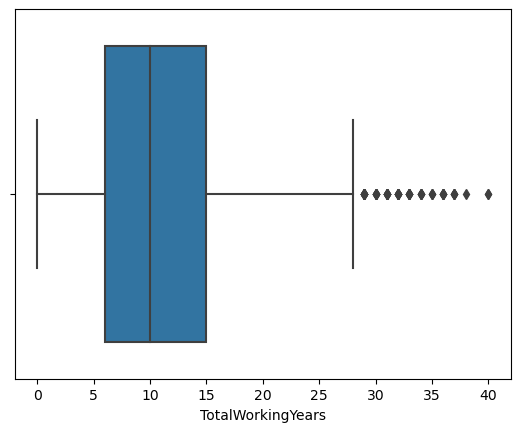

Boxplot for the column  YearsAtCompany


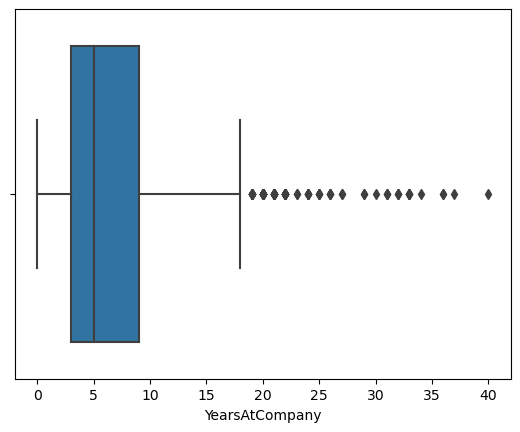

Boxplot for the column  YearsInCurrentRole


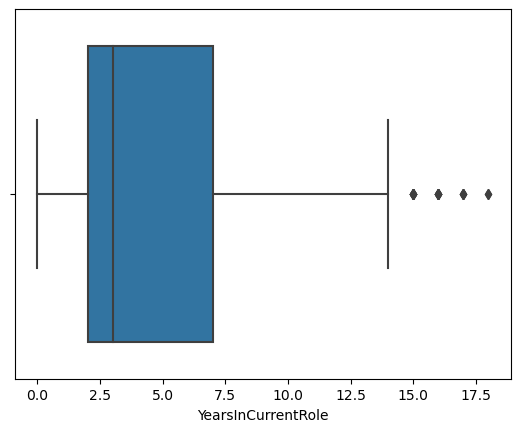

Boxplot for the column  YearsSinceLastPromotion


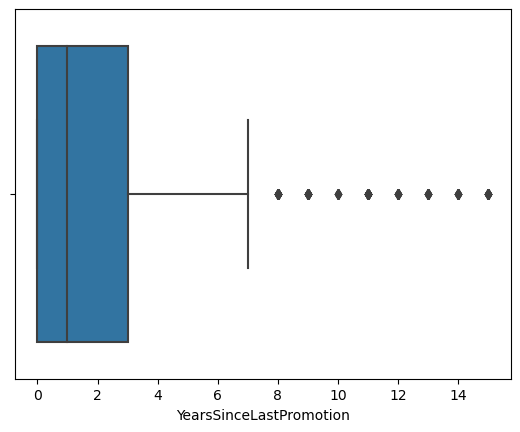

Boxplot for the column  YearsWithCurrManager


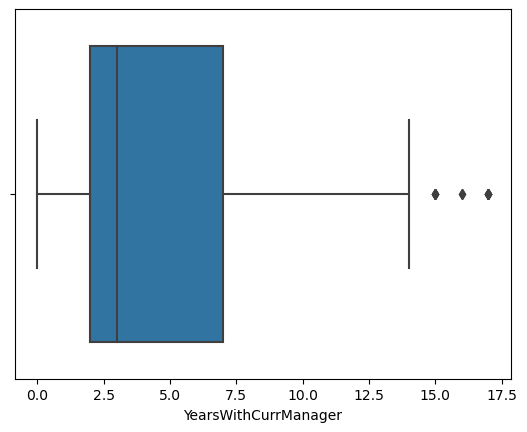

In [21]:
for i in df2.select_dtypes(exclude='O').columns:
    print('Boxplot for the column ', i)
    sns.boxplot(data=df2, x=i)
    plt.show()

Bivariate Bar Graph for attrition vs  Age


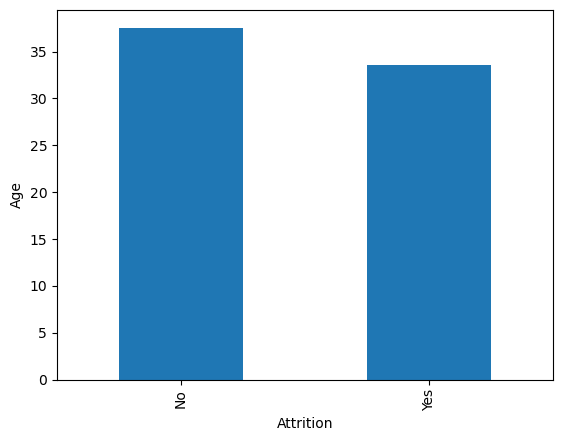

Bivariate Bar Graph for attrition vs  DailyRate


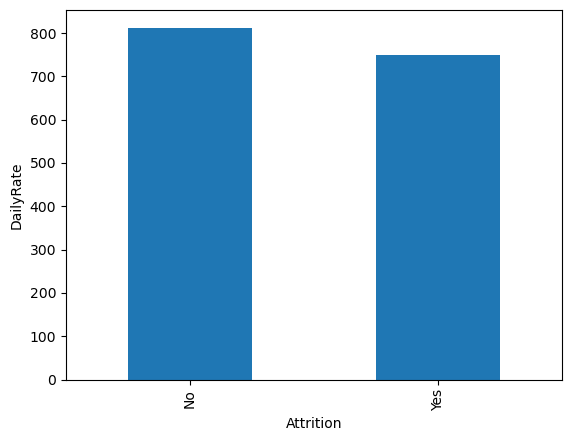

Bivariate Bar Graph for attrition vs  DistanceFromHome


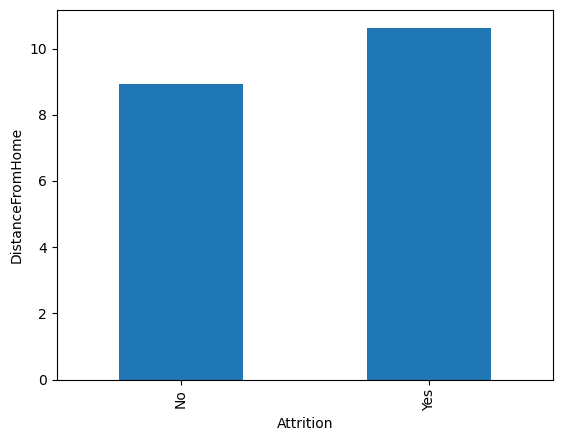

Bivariate Bar Graph for attrition vs  EmployeeNumber


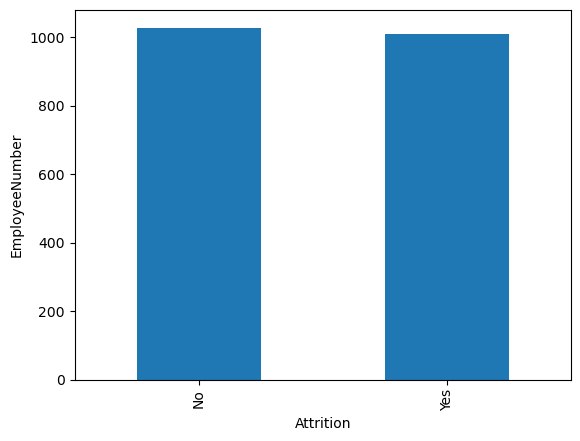

Bivariate Bar Graph for attrition vs  HourlyRate


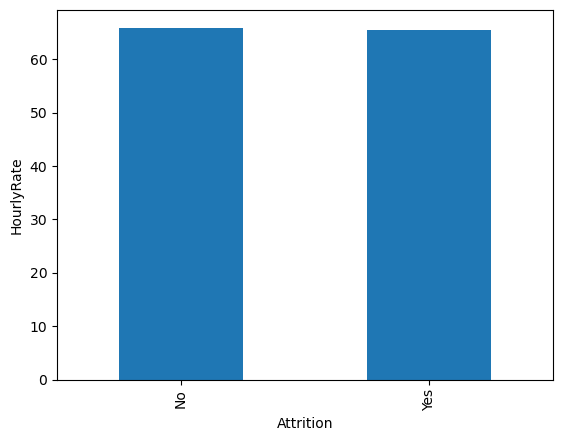

Bivariate Bar Graph for attrition vs  MonthlyIncome


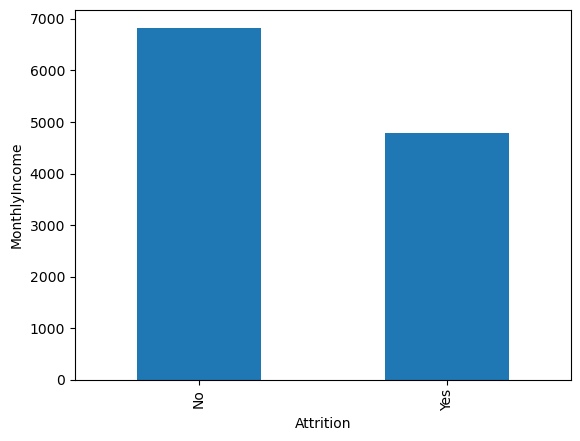

Bivariate Bar Graph for attrition vs  MonthlyRate


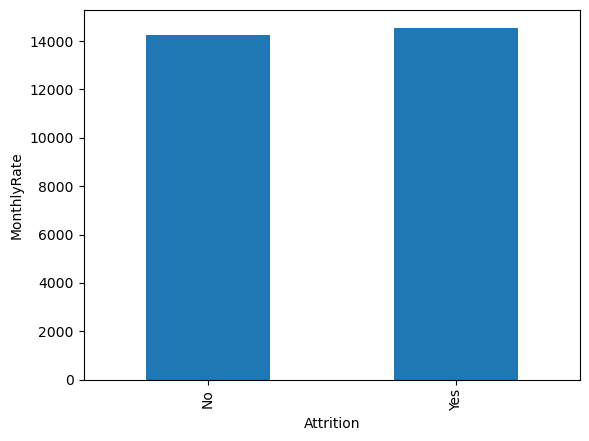

Bivariate Bar Graph for attrition vs  PercentSalaryHike


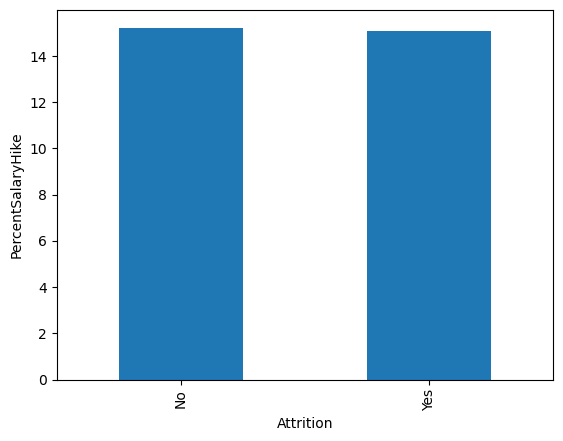

Bivariate Bar Graph for attrition vs  TotalWorkingYears


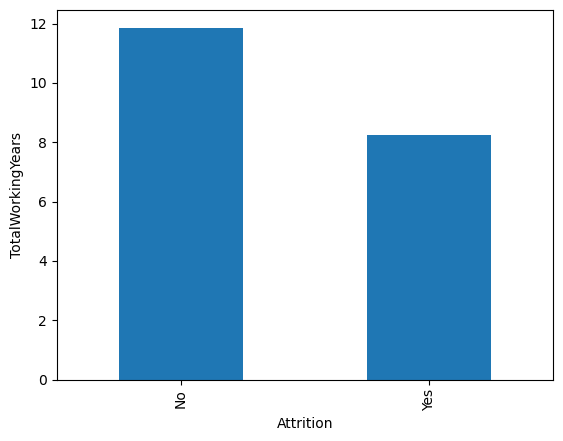

Bivariate Bar Graph for attrition vs  YearsAtCompany


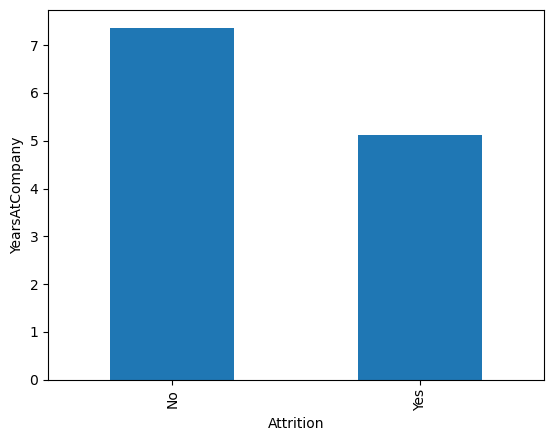

Bivariate Bar Graph for attrition vs  YearsInCurrentRole


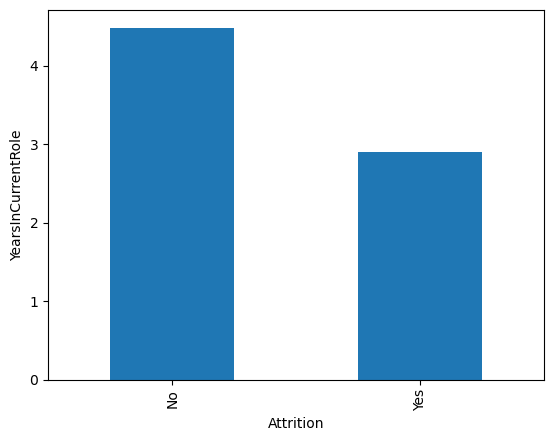

Bivariate Bar Graph for attrition vs  YearsSinceLastPromotion


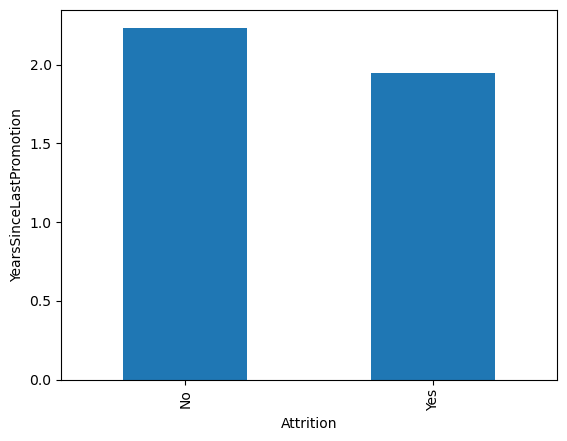

Bivariate Bar Graph for attrition vs  YearsWithCurrManager


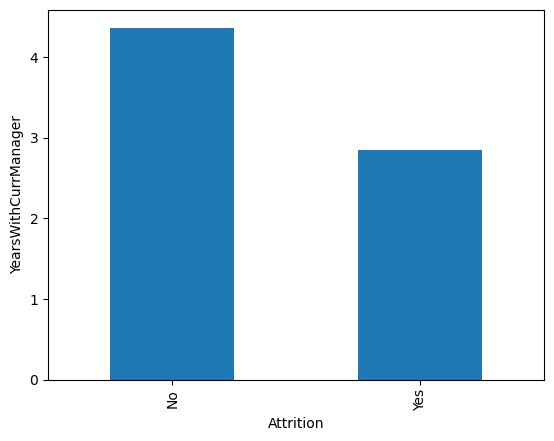

In [22]:
for i in df2.select_dtypes(exclude='O').columns:
    print("Bivariate Bar Graph for attrition vs ", i)
    df2.groupby('Attrition')[i].mean().plot(kind='bar')
    plt.ylabel(i)
    plt.show()

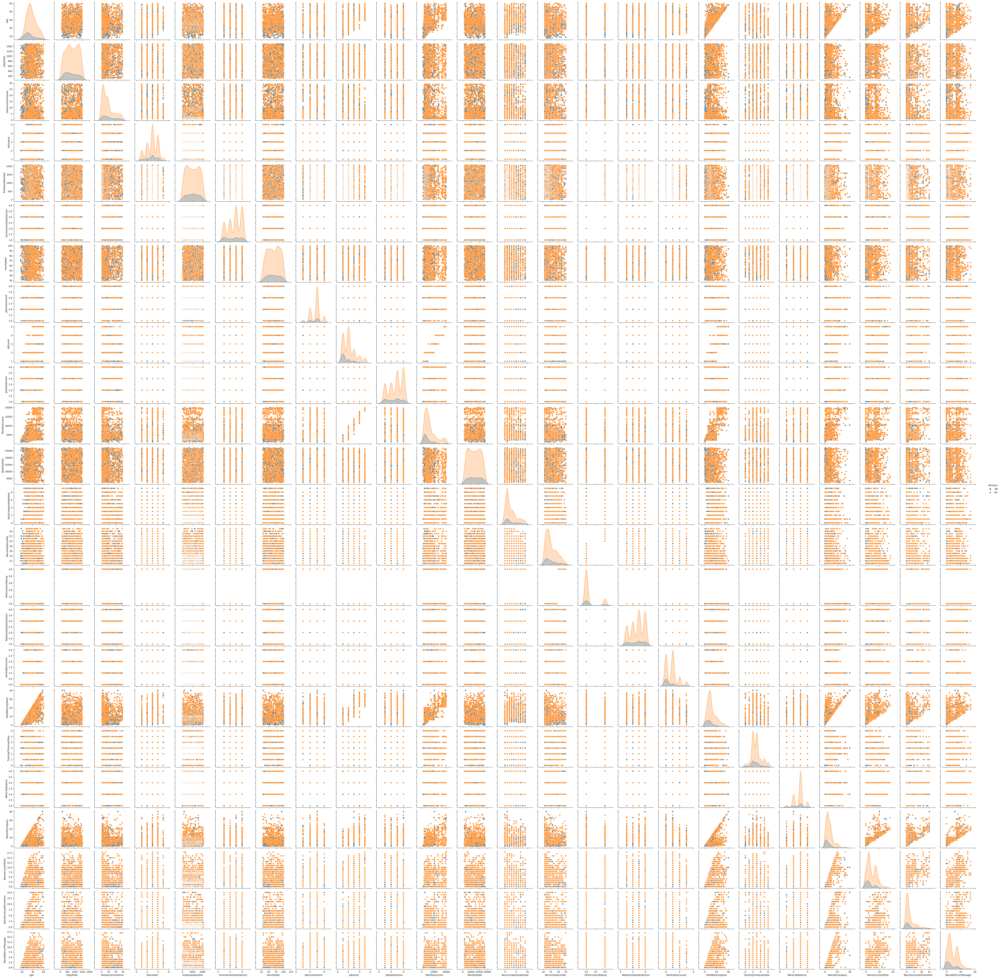

In [50]:
sns.pairplot(df2, hue='Attrition')
plt.show()

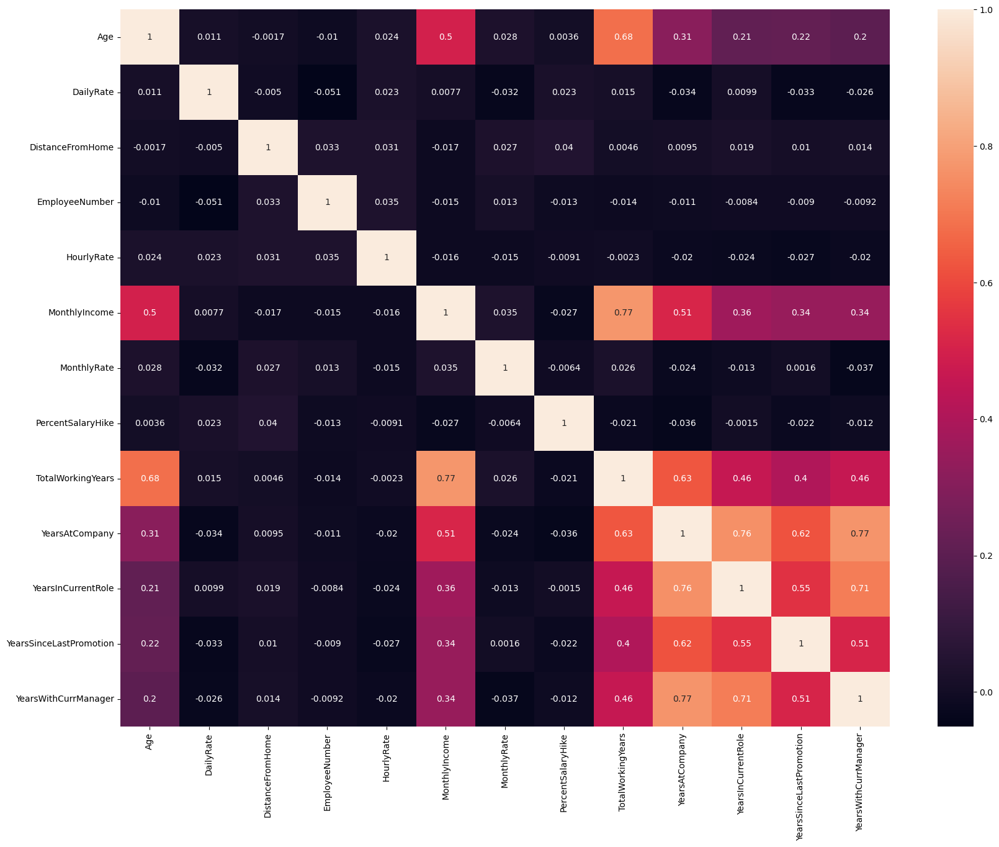

In [23]:
plt.figure(figsize=(20,15))
sns.heatmap(df2.corr(), annot=True)
plt.show()

In [24]:
df2.Attrition.unique()

array(['Yes', 'No'], dtype=object)

In [25]:
df2["Attrition"].replace({"Yes" : 1, "No" : 0}, inplace = True)

In [26]:
df2.Attrition.unique()

array([1, 0], dtype=int64)

In [30]:
num_df=df2.drop('Attrition',axis=1).select_dtypes(exclude=object)
cat_df=df2.select_dtypes(include=object)
y=df2.Attrition

In [31]:
from sklearn.feature_selection import f_classif

f_values, p_values = f_classif(num_df, y)

p_values_df = pd.DataFrame({
    'Feature': num_df.columns,
    'P-Value < 0.05': p_values<0.05
})

p_values_df

,Feature,P-Value < 0.05
0,Age,True
1,DailyRate,True
2,DistanceFromHome,True
3,EmployeeNumber,False
4,HourlyRate,False
5,MonthlyIncome,True
6,MonthlyRate,False
7,PercentSalaryHike,False
8,TotalWorkingYears,True
9,YearsAtCompany,True


In [28]:
num_df_new=num_df.drop(['EmployeeNumber','MonthlyRate'],axis=1)

In [32]:
ss = StandardScaler()
num_df_scaled = pd.DataFrame(ss.fit_transform(num_df_new), columns = num_df_new.columns)

In [33]:
for i in cat_df.columns:
    print(i,':',df2[i].nunique())

BusinessTravel : 3
Department : 3
Education : 5
EducationField : 6
EnvironmentSatisfaction : 4
Gender : 2
JobInvolvement : 4
JobLevel : 5
JobRole : 9
JobSatisfaction : 4
MaritalStatus : 3
NumCompaniesWorked : 10
OverTime : 2
PerformanceRating : 2
RelationshipSatisfaction : 4
StockOptionLevel : 4
TrainingTimesLastYear : 7
WorkLifeBalance : 4


In [34]:
target = ['NumCompaniesWorked','TrainingTimesLastYear','EducationField']

In [35]:
target_encoder = ce.TargetEncoder(cols = ['NumCompaniesWorked','TrainingTimesLastYear','EducationField'])
cat_df[['NumCompaniesWorked','TrainingTimesLastYear','EducationField']] = target_encoder.fit_transform(cat_df[['NumCompaniesWorked','TrainingTimesLastYear','EducationField']], df2["Attrition"])

In [36]:
cat_df.columns

Index(['BusinessTravel', 'Department', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'NumCompaniesWorked',
       'OverTime', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance'],
      dtype='object')

In [37]:
label=['BusinessTravel', 'Department', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'OverTime', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'WorkLifeBalance']

In [38]:
label_encoder = LabelEncoder()

for i in label:
    cat_df[i] = label_encoder.fit_transform(cat_df[i])

In [39]:
cat_df.describe()

,BusinessTravel,Department,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,NumCompaniesWorked,OverTime,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,WorkLifeBalance
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,1.607483,1.260544,1.912925,0.160630,1.721769,0.600000,1.729932,1.063946,4.458503,1.728571,1.097279,0.161105,0.282993,0.153741,1.712245,0.793878,0.161130,1.761224
std,0.665455,0.527792,1.024165,0.037106,1.093082,0.490065,0.711561,1.106940,2.461821,1.102846,0.730121,0.048341,0.450606,0.360824,1.081209,0.852077,0.036841,0.706476
min,0.000000,0.000000,0.000000,0.134201,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100629,0.000000,0.000000,0.000000,0.000000,0.093065,0.000000
25%,1.000000,1.000000,1.000000,0.135776,1.000000,0.000000,1.000000,0.000000,2.000000,1.000000,1.000000,0.116751,0.000000,0.000000,1.000000,0.000000,0.140530,1.000000
50%,2.000000,1.000000,2.000000,0.146865,2.000000,1.000000,2.000000,1.000000,5.000000,2.000000,1.000000,0.188100,0.000000,0.000000,2.000000,1.000000,0.140530,2.000000
75%,2.000000,2.000000,3.000000,0.146865,3.000000,1.000000,2.000000,2.000000,7.000000,3.000000,2.000000,0.188100,1.000000,0.000000,3.000000,1.000000,0.179159,2.000000
max,2.000000,2.000000,4.000000,0.242423,3.000000,1.000000,3.000000,4.000000,8.000000,3.000000,2.000000,0.252727,1.000000,1.000000,3.000000,3.000000,0.274014,3.000000


In [40]:
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest

In [41]:
chi2_selector = SelectKBest(chi2, k='all') 
chi2_selector.fit(cat_df, y)

print('pval 0.05 features :',cat_df.columns[chi2_selector.pvalues_ < 0.05])
print('Removable features :',set(cat_df.columns)-set(cat_df.columns[chi2_selector.pvalues_ < 0.05]))

pval 0.05 features : Index(['EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobRole',
       'JobSatisfaction', 'MaritalStatus', 'OverTime', 'StockOptionLevel'],
      dtype='object')
Removable features : {'BusinessTravel', 'NumCompaniesWorked', 'RelationshipSatisfaction', 'Gender', 'Department', 'WorkLifeBalance', 'TrainingTimesLastYear', 'Education', 'PerformanceRating', 'EducationField'}


In [42]:
X=pd.concat([num_df_scaled,cat_df],axis=1)

In [43]:
xtrain,xtest,ytrain,ytest=train_test_split(X,y,test_size=0.3, random_state=10)

In [44]:
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(1029, 29)
(441, 29)
(1029,)
(441,)


In [45]:
score_card = pd.DataFrame(columns=['Model name', 'AUC Score', 'Precision Score', 'Recall Score',
                                       'Accuracy Score', 'Kappa Score', 'f1-score'])

def update_score_card(model, name):
    
    y_pred_train = model.predict(xtrain)
    y_pred_test = model.predict(xtest)
    
    global score_card

    score_card = score_card.append({'Model name' : name,
                                    'AUC Score' : roc_auc_score(ytest, ypred_test),
                                    'Precision Score': precision_score(ytest, ypred_test),
                                    'Recall Score': recall_score(ytest, ypred_test),
                                    'Accuracy Score': accuracy_score(ytest, ypred_test),
                                    'Kappa Score': cohen_kappa_score(ytest, ypred_test),
                                    'f1-score': f1_score(ytest, ypred_test, average='macro')}, 
                                    ignore_index = True)
    
    ConfusionMatrixDisplay.from_predictions(ytest,ypred_test,cmap="Blues")
    plt.show()

    return(score_card)

In [46]:
lr_model = LogisticRegression()
lr_model.fit(xtrain, ytrain)

LogisticRegression()

In [47]:
ypred_test = lr_model.predict(xtest)

In [48]:
accuracy_score(ytest, ypred_test)

0.8458049886621315

In [49]:
precision_score(ytest, ypred_test)

0.7352941176470589

In [50]:
recall_score(ytest, ypred_test)

0.2976190476190476

In [51]:
f1_score(ytest, ypred_test)

0.42372881355932207

In [52]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.86      0.97      0.91       357
           1       0.74      0.30      0.42        84

    accuracy                           0.85       441
   macro avg       0.80      0.64      0.67       441
weighted avg       0.83      0.85      0.82       441



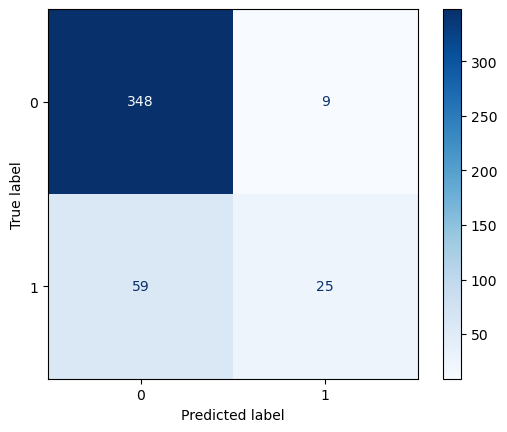

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362


In [53]:
update_score_card(lr_model, 'Logistic Regression')

In [54]:
knn = KNeighborsClassifier()
knn.fit(xtrain, ytrain)

KNeighborsClassifier()

In [55]:
ypred_test = knn.predict(xtest)

In [56]:
accuracy_score(ytest, ypred_test)

0.8299319727891157

In [57]:
precision_score(ytest, ypred_test)

0.8

In [58]:
recall_score(ytest, ypred_test)

0.14285714285714285

In [59]:
f1_score(ytest, ypred_test)

0.24242424242424243

In [60]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.83      0.99      0.90       357
           1       0.80      0.14      0.24        84

    accuracy                           0.83       441
   macro avg       0.82      0.57      0.57       441
weighted avg       0.83      0.83      0.78       441



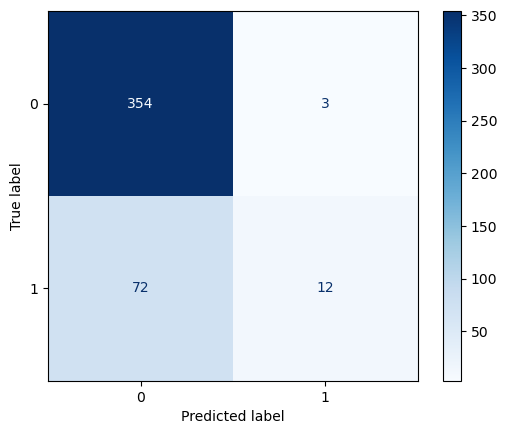

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319


In [61]:
update_score_card(knn, 'KNN')

In [62]:
dt = DecisionTreeClassifier()
dt.fit(xtrain, ytrain)

DecisionTreeClassifier()

In [63]:
ypred_test = dt.predict(xtest)

In [64]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.86      0.85      0.85       357
           1       0.38      0.39      0.39        84

    accuracy                           0.76       441
   macro avg       0.62      0.62      0.62       441
weighted avg       0.77      0.76      0.77       441



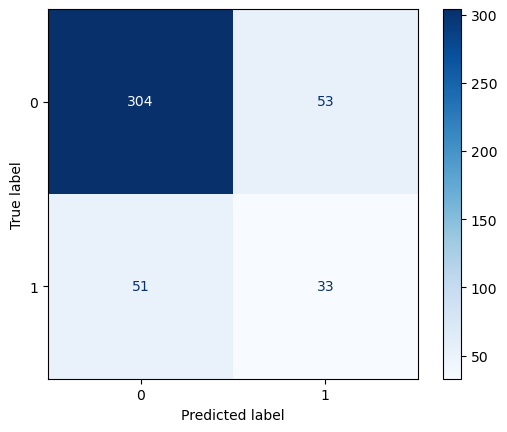

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319
2,DT,0.622199,0.383721,0.392857,0.764172,0.242193,0.621084


In [65]:
update_score_card(dt, 'DT')

In [66]:
rf = RandomForestClassifier()
rf.fit(xtrain, ytrain)

RandomForestClassifier()

In [67]:
ypred_test = rf.predict(xtest)

In [68]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.83      0.99      0.91       357
           1       0.81      0.15      0.26        84

    accuracy                           0.83       441
   macro avg       0.82      0.57      0.58       441
weighted avg       0.83      0.83      0.78       441



In [69]:
rf.feature_importances_

array([0.0586797 , 0.06088885, 0.05268133, 0.05579243, 0.08108885,
       0.03994238, 0.04980753, 0.04396366, 0.02533018, 0.02348793,
       0.03060155, 0.01442129, 0.01230748, 0.02299444, 0.02764498,
       0.03535524, 0.00919982, 0.02489849, 0.02405228, 0.03276947,
       0.03415213, 0.02850459, 0.03834031, 0.05369255, 0.00545594,
       0.02419897, 0.03249835, 0.03009812, 0.02715115])

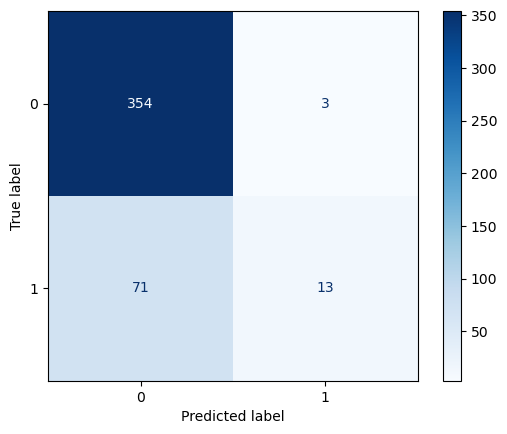

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319
2,DT,0.622199,0.383721,0.392857,0.764172,0.242193,0.621084
3,RF,0.573179,0.812500,0.154762,0.832200,0.211968,0.582685


In [70]:
update_score_card(rf, 'RF')

In [71]:
gb_model = GradientBoostingClassifier()
gb_model.fit(xtrain,ytrain)

GradientBoostingClassifier()

In [72]:
ypred_test = gb_model.predict(xtest)

In [73]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.86      0.98      0.92       357
           1       0.79      0.32      0.46        84

    accuracy                           0.85       441
   macro avg       0.83      0.65      0.69       441
weighted avg       0.85      0.85      0.83       441



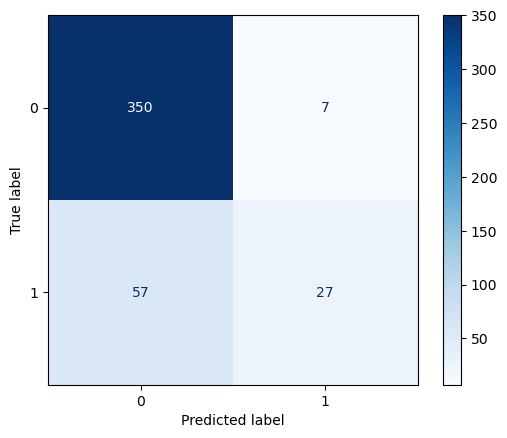

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319
2,DT,0.622199,0.383721,0.392857,0.764172,0.242193,0.621084
3,RF,0.573179,0.812500,0.154762,0.832200,0.211968,0.582685
4,GB,0.650910,0.794118,0.321429,0.854875,0.390752,0.686929


In [74]:
update_score_card(gb_model, 'GB')

In [75]:
dtf = DecisionTreeClassifier()
ada_boost = AdaBoostClassifier(dtf)
ada_boost.fit(xtrain, ytrain)

AdaBoostClassifier(estimator=DecisionTreeClassifier())

In [76]:
ypred_test = ada_boost.predict(xtest)

In [77]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.85      0.85      0.85       357
           1       0.38      0.38      0.38        84

    accuracy                           0.76       441
   macro avg       0.62      0.62      0.62       441
weighted avg       0.76      0.76      0.76       441



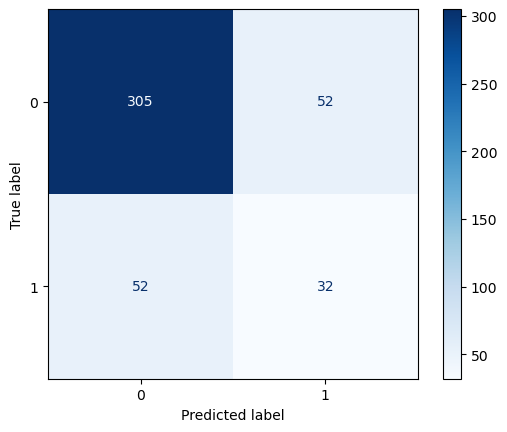

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319
2,DT,0.622199,0.383721,0.392857,0.764172,0.242193,0.621084
3,RF,0.573179,0.812500,0.154762,0.832200,0.211968,0.582685
4,GB,0.650910,0.794118,0.321429,0.854875,0.390752,0.686929
5,ADA,0.617647,0.380952,0.380952,0.764172,0.235294,0.617647


In [78]:
update_score_card(ada_boost, 'ADA')

In [79]:
dtf = LogisticRegression()
ada_boostlr = AdaBoostClassifier(dtf)
ada_boostlr.fit(xtrain, ytrain)

AdaBoostClassifier(estimator=LogisticRegression())

In [80]:
ypred_test = ada_boostlr.predict(xtest)

In [81]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.84      0.98      0.91       357
           1       0.72      0.21      0.33        84

    accuracy                           0.83       441
   macro avg       0.78      0.60      0.62       441
weighted avg       0.82      0.83      0.80       441



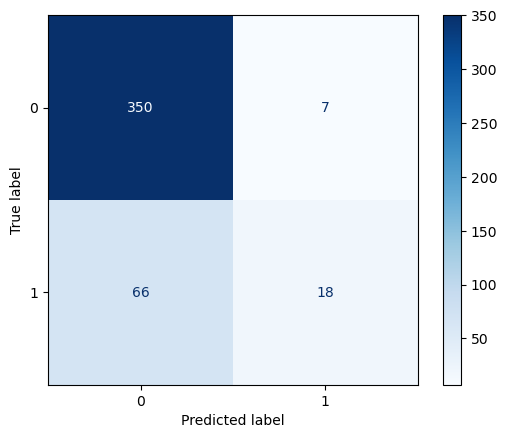

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319
2,DT,0.622199,0.383721,0.392857,0.764172,0.242193,0.621084
3,RF,0.573179,0.812500,0.154762,0.832200,0.211968,0.582685
4,GB,0.650910,0.794118,0.321429,0.854875,0.390752,0.686929
5,ADA,0.617647,0.380952,0.380952,0.764172,0.235294,0.617647
6,ADA LR,0.597339,0.720000,0.214286,0.834467,0.266156,0.617919


In [82]:
update_score_card(ada_boostlr, 'ADA LR')

In [83]:
from sklearn.linear_model import LogisticRegression

modellr = LogisticRegression(penalty='l2', C=0.1)
modellr.fit(xtrain, ytrain)


LogisticRegression(C=0.1)

In [84]:
ypred_test = modellr.predict(xtest)

In [85]:
print(classification_report(ytest, ypred_test))

              precision    recall  f1-score   support

           0       0.84      0.99      0.90       357
           1       0.75      0.18      0.29        84

    accuracy                           0.83       441
   macro avg       0.79      0.58      0.60       441
weighted avg       0.82      0.83      0.79       441



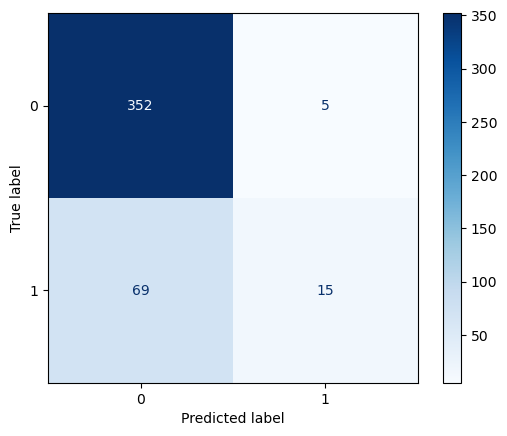

,Model name,AUC Score,Precision Score,Recall Score,Accuracy Score,Kappa Score,f1-score
0,Logistic Regression,0.636204,0.735294,0.297619,0.845805,0.352675,0.667362
1,KNN,0.567227,0.800000,0.142857,0.829932,0.196018,0.573319
2,DT,0.622199,0.383721,0.392857,0.764172,0.242193,0.621084
3,RF,0.573179,0.812500,0.154762,0.832200,0.211968,0.582685
4,GB,0.650910,0.794118,0.321429,0.854875,0.390752,0.686929
5,ADA,0.617647,0.380952,0.380952,0.764172,0.235294,0.617647
6,ADA LR,0.597339,0.720000,0.214286,0.834467,0.266156,0.617919
7,LR L2,0.582283,0.750000,0.178571,0.832200,0.232213,0.596673


In [86]:
update_score_card(modellr, 'LR L2')